# Geophysical Simulator

To start the work with geophysical navigation we need to establish a reasonable test bed to generate IMU trajectories and corresponding geophysical sensor measurements of the region. We can then develop an open loop navigaiton solution using just the IMU velocities and geophysical measurements, use this to correct an INS, and examine if the INS Kalman Filter is still useful. We will use the `pyins` package to generate the IMU/INS data, and `pygmt` to pull in the geophysical maps and simulate the measurements.

PyGMT is a plotting toolset, but provides interfaces to read into memory the datasets provided by [The Genenric Mapping Tools](https://www.generic-mapping-tools.org/remote-datasets). GMT is a command line interface that we will use to pull in the pre-formatted data so that we can load, plot, and access it through the PyGMT interface. [See this reference](https://docs.generic-mapping-tools.org/latest/datasets/remote-data.html#)

---

## Library imports

In [1]:
import pygmt, subprocess, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Using GMT to download maps

Next we'll use the `subprocess.run()` command to access and use the GMT library. GMT is a set of command-line tools for accessing and manipulating maps. We'll set up the map we want to query as well as the coordinates to crop to and the output file name.

In [2]:
data_map = "earth_relief_15s_p" # terrain map
west_lon = -78
east_lon = -72
south_lat = 34
north_lat = 42
output_filename = "mid_atlantic_reilef"

# Note: the -Rd specificies the region in degrees with the +/- configurations; ex: longitude bounds are +/-180 
# rather than 0 to 360
cmd = f"gmt grdcut @{data_map} -Rd{west_lon}/{east_lon}/{south_lat}/{north_lat} -G{output_filename}.nc"
print(cmd)

gmt grdcut @earth_relief_15s_p -Rd-78/-72/34/42 -Gmid_atlantic_reilef.nc


In [3]:
out = subprocess.run(cmd, capture_output=True, text=True)
print(out.stderr)

So since PyGMT is a bit of pain in the ass regarding dependancies, and I only really want to use it for accessing and formatting the raw map data, we're going to keep PyGMT in its own self-contained conda environment and use the 'conda run' command to interact with the GMT command line as show above like so:

`subprocess.run([f'conda run -n PyGMT python script_to_call.py'])`

where `script_to_call.py` will need to be formatted to interact with using the command line, but should effectively be a light wrapper around the `gmt grdcut` command above.

The raw data can be loaded using PyGMT's `io` [module](https://github.com/GenericMappingTools/pygmt/blob/main/pygmt/io.py) which amounts to this:

```
import xarray as xr
with xr.open_dataarray(filename_or_obj, **kwargs) as dataarray:
        result = dataarray.load()
```

## Using PyGMT to interact with maps in Python

With the map saved into our local directory we'll use `pygmt` to load and plot it. Note: `pygmt` does not like spaces on the file path. We'll also plot a couple of waypoints for our future simulated trajectory.

In [4]:
data = pygmt.load_dataarray(os.path.join(os.getcwd(), f"{output_filename}.nc"))

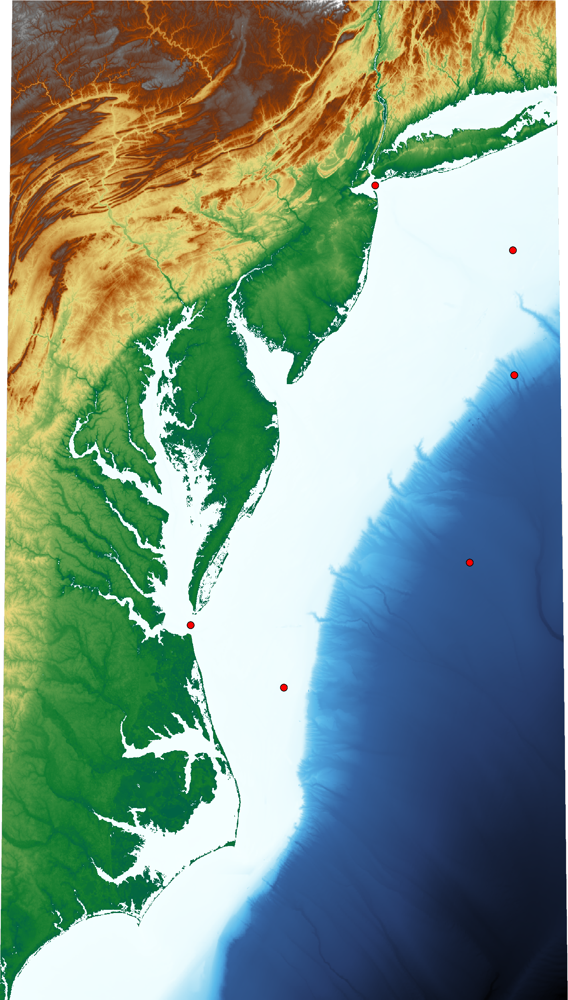

In [5]:
lons = [-74.00, -72.5, -72.5, -73.0, -75.0, -76.0]
lats = [ 40.52,  40.0,  39.0,  37.5,  36.5,  37.0]

fig = pygmt.Figure()
fig.grdimage(data, projection='R12c', cmap='geo')
fig.plot(x=lons, y=lats, style="c0.15c", color="red", pen="black")
fig.show()

## Manual position-based trajectory

This will be a constant along-ship velocity trajectory of 5 m/s (approximately 10 knots), so in order to interpolate we need to know the distance between each waypoint.

NOTE: the position based method doesn't quite seem to be working when integrated into the INS simulation. I'll leave this here for now as an example of position smoothing, but the velocity-based method should be used for generating trajectories.

In [6]:
import haversine as hs

In [7]:
distances = []
for i in range(5):
    start = (lats[i], lons[i])
    stop = (lats[i+1], lons[i+1])
    distances.append(hs.haversine(start, stop, unit=hs.Unit.METERS))
distances

[139797.98340790626,
 111195.08023353307,
 172411.73047285632,
 209537.26093377155,
 105018.49642529833]

With the distances calculated we can now use NumPy to create a linearly spaced set of intermitent waypoints that can be used in the IMU simulation.

In [8]:
n = int(distances[0] / 5)
leg_one = np.linspace((lons[0], lats[0]), (lons[1], lats[1]), n)
n = int(distances[1] / 5)
leg_two = np.linspace((lons[1], lats[1]), (lons[2], lats[2]), n)
n = int(distances[2] / 5)
leg_three = np.linspace((lons[2], lats[2]), (lons[3], lats[3]), n)
n = int(distances[3] / 5)
leg_four = np.linspace((lons[3], lats[3]), (lons[4], lats[4]), n)
n = int(distances[4] / 5)
leg_five = np.linspace((lons[4], lats[4]), (lons[5], lats[5]), n)
pos = np.concatenate([leg_one, leg_two[1:,:], leg_three[1:,:], leg_four[1:,:], leg_five[1:,:]])

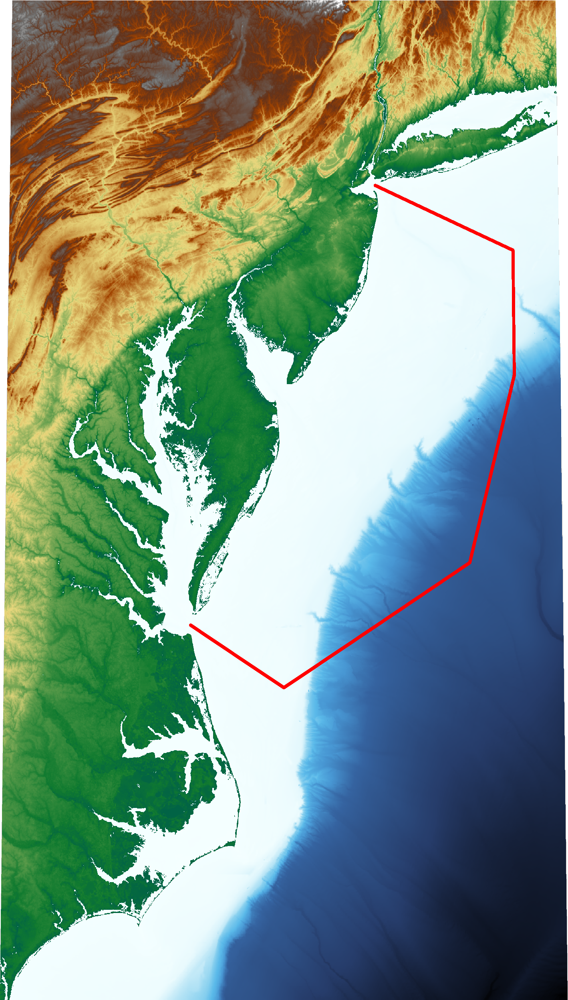

In [9]:
fig = pygmt.Figure()
fig.grdimage(data, projection='R12c', cmap='geo')
fig.plot(x=pos[:,0], y=pos[:,1], style="c0.05c", color="red", pen="red")
fig.show()

In [10]:
# Appending the altitude state
L = len(pos)
alt = np.zeros((L,1))

The INS simulator works with DataFrames so we'll import Pandas and restructure the data as a DataFrame

In [11]:
lla = pd.DataFrame(data={'lat': pos[:,1], 'lon':pos[:,0], 'alt':alt[:,0]})

The transition between segments should be smooth however, representing a constant rate turn.

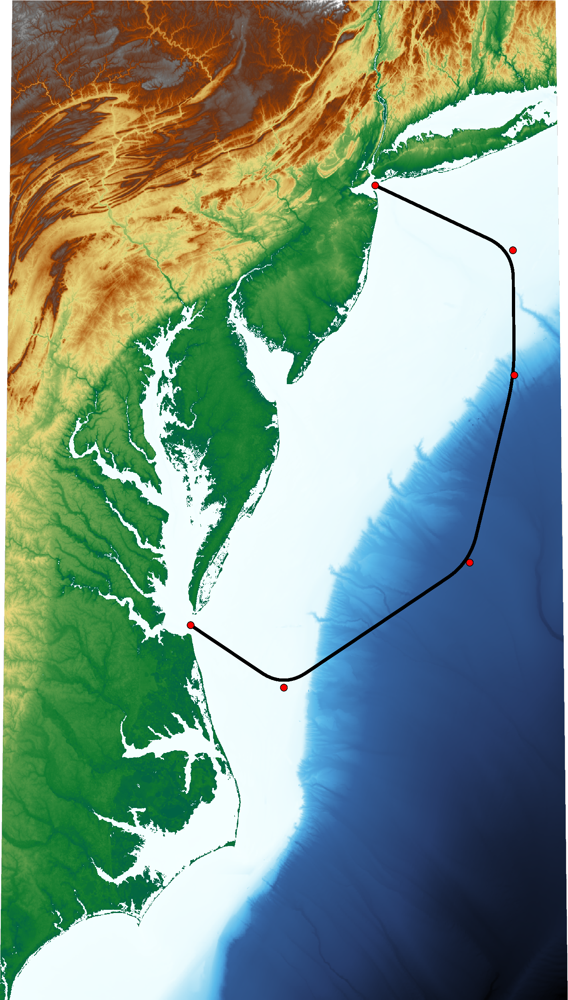

In [12]:
traj_smooth = lla.copy()
K = 10000
kernel = np.ones(K)/K
traj_smooth['lat'][K:-K] = np.convolve(traj_smooth['lat'], kernel, mode='same')[K:-K]
traj_smooth['lon'][K:-K] = np.convolve(traj_smooth['lon'], kernel, mode='same')[K:-K]

fig = pygmt.Figure()
fig.grdimage(data, projection='R12c', cmap='geo')
fig.plot(x=traj_smooth['lon'], y=traj_smooth['lat'], style="c0.05c", color="black", pen="black")
fig.plot(x=lons, y=lats, style="c0.15c", color="red", pen="black")
fig.show()

We'll now simulate the IMU and INS output using PyINS.

In [13]:
dy = ((traj_smooth['lat']).to_numpy())[1:] - (traj_smooth['lat']).to_numpy()[0:-1]
dx = ((traj_smooth['lon']).to_numpy())[1:] - (traj_smooth['lon']).to_numpy()[0:-1]
h = np.rad2deg(np.arctan2(dy, dx))
#h = np.concatenate([[h[0]], [h]])
rph = np.zeros((L,3))
rph[0, 0] = h[0]
rph[1:,2] = h

traj, gyro, accel = pyins.sim.from_position(1, traj_smooth, rph)

NameError: name 'pyins' is not defined

Let's examine the velocity, gyro, and acceleration data.

In [ ]:
time = range(len(traj))
plt.plot(time, traj['VN'], time, traj['VE'], time, traj['VD'])
plt.show()

The velocities are not smooth where we concatenated the initial and ending trajectories with the convolution smoothing.

In [ ]:
traj['VN'][K-100:K+100] = np.ones_like(traj['VN'][K-100:K+100]) * traj['VN'][K-100]
traj['VE'][K-100:K+100] = np.ones_like(traj['VE'][K-100:K+100]) * traj['VE'][K-100]
traj['VN'][-K-100:-K+100] = np.ones_like(traj['VN'][-K-100:-K+100]) * traj['VN'][len(traj['VN'])-K-100]
traj['VE'][-K-100:-K+100] = np.ones_like(traj['VE'][-K-100:-K+100]) * traj['VE'][len(traj['VN'])-K-100]

In [ ]:
plt.plot(time, traj['VN'], time, traj['VE'], time, traj['VD'])
plt.show()

Now examining the accelerations.

In [ ]:
# First two channels should be zero, third (verticle) channel should be gravity
plt.plot(accel[:,0])
plt.plot(accel[:,1])
plt.plot(accel[:,2])

In [ ]:
accel[:,0:2] = np.zeros_like(accel[:,0:2])

In [ ]:
plt.plot(gyro[:,0])
plt.plot(gyro[:,1])
plt.plot(gyro[:,2])

In [ ]:
traj

In [ ]:
plt.plot(gyro[:,0])
plt.plot(gyro[:,1])
plt.plot(gyro[:,2])
plt.show()

---

## Working through the PyINS module

PyINS provides a toolbox for simulating inertial trajectories and calculating a position using the canonical representations of the Navigation Kalamn Filter.

### Integrating perfect data

We'll start off by generating a trajectory, using the velocity option appears to be more stable and reliable and produces results that make sense.

In [24]:
from pyins import sim
import pyins.strapdown as stpdwn
from pyins.filt import FeedbackFilter
import pyins

In [25]:
# Define trajectory components
n_samples = 3600*24
LLA0 = [lats[1], lons[1], 0]    # Initial point
RPH = np.zeros((n_samples, 3))  # Roll, pitch, heading
RPH[:, 2] = 235                 # Initial heading in degrees
# Compute constant velocity components
q = np.deg2rad(235)
v = 5
vels = np.array([[np.sin(q)*q, np.cos(q)*v, 0]])
vels = np.tile(vels, (n_samples, 1))

# Calculate ground truth trajectory
traj, gyro, accel = sim.from_velocity(1, LLA0, vels, RPH)

# Set up inertial integrator
integrator = stpdwn.StrapdownIntegrator(1, LLA0, vels[0,:], RPH[0,:], with_altitude=False)
theta, dv = stpdwn.compute_theta_and_dv(gyro, accel)
traj_strapdown = integrator.integrate(theta, dv)

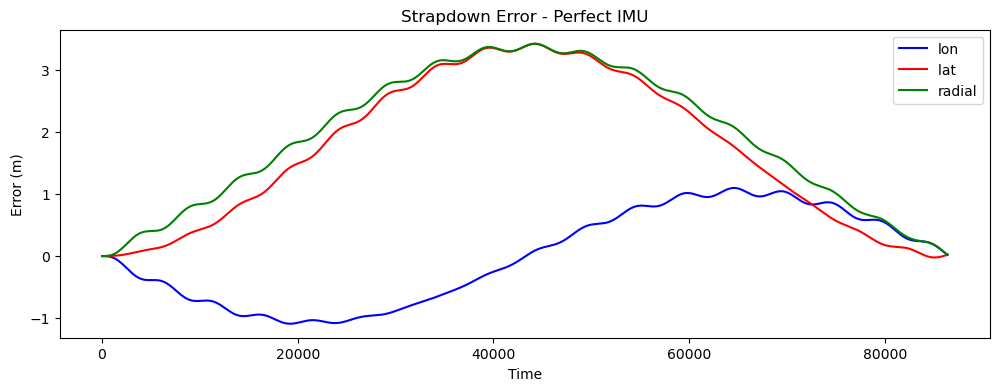

In [26]:
from pyins.transform import difference_trajectories
diffs = difference_trajectories(traj, traj_strapdown)
east_err = np.power(diffs.east.to_numpy(),2)
north_err = np.power(diffs.north.to_numpy(),2)
distance = np.sqrt(east_err + north_err)
drift = np.cumsum(distance)

#fig, (ax0, ax1) = plt.subplots(2,1, figsize=(12,4))
plt.figure(figsize=(12,4))
plt.plot(diffs.index, diffs.east, '-b', label='lon')
plt.plot(diffs.index, diffs.north, '-r', label='lat ')
plt.plot(diffs.index, distance, '-g', label='radial')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Error (m)')
plt.title('Strapdown Error - Perfect IMU')
plt.show()

We're now seeing the typical un-aided Schuler oscilations we are expecting. With perfect inertial inputs we still see errors and the typical oscilations with global navigation.

### Integrating "real" data

We can now simulate the trajectory with noise to simulate a real INS. The error will be a sum of a random bias and additive white noise. We define magnitudes typical for moderately accurate navigation grade sensors.

In [27]:
# Sensor parameters
gyro_bias_sd = np.deg2rad(0.05) / 3600  # 0.05 d/h
accel_bias_sd = 5e-3                    # m/s^2
gyro_noise = 1e-6                       # rad / s^0.5
accel_noise = 3e-4                      # m / s^1.5

# Set the random seed for repeatability
np.random.seed(1)
gyro_bias = gyro_bias_sd * np.random.uniform(-2, 2, 3)
accel_bias = accel_bias_sd * np.random.uniform(-2, 2, 3)

In [28]:
dt=1
# Now appply errors to the inertial readings
gyro_e = gyro + gyro_bias * dt + gyro_noise * np.random.randn(*gyro.shape) * dt**0.5
accel_e = accel + accel_bias * dt + accel_noise * np.random.randn(*accel.shape) * dt**0.5
# Compute angular velocities and linear accelerations by applying coning and sculling corrections
theta_e, dv_e = stpdwn.compute_theta_and_dv(gyro_e, accel_e)

In [29]:
# Set initialization to a high-quality GPS fix
lla0 = pyins.transform.perturb_lla(LLA0, [10, 10, 0])

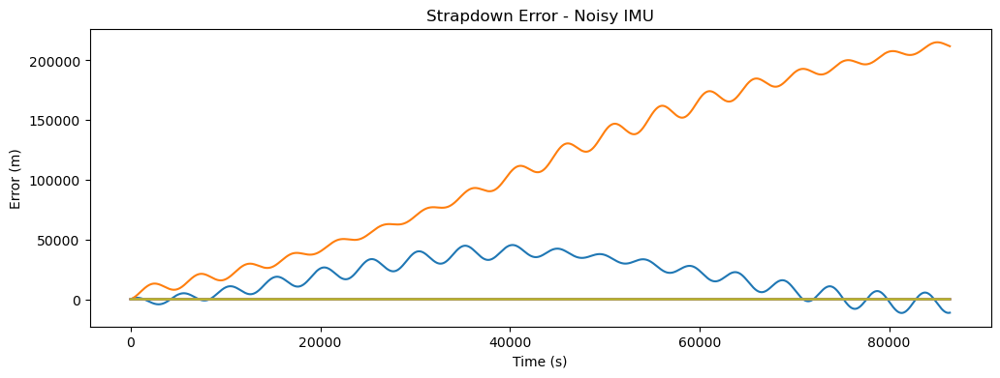

In [30]:
# Integrate the IMU output, alignment is done with setting the initial
# conditions for the integrator
v0 = [0,0,0]
integrator = stpdwn.StrapdownIntegrator(1, lla0, v0, RPH[0,:], with_altitude=False)
traj_imu = integrator.integrate(theta_e, dv_e)
dists = pyins.transform.difference_trajectories(traj_imu, traj)

plt.figure(figsize=(12,4))
plt.plot(dists)
plt.xlabel('Time (s)')
plt.ylabel('Error (m)')
plt.title('Strapdown Error - Noisy IMU')
plt.show()

## Aiding from GPS

Now we will use ideal GPS position observations for INS errors estimation and correction. We assume that GPS is available every second and use known exact values of latitude and longitude:

In [31]:
dt_GPS = 1 # s
delta = int(dt_GPS / dt)
gps_data = pd.DataFrame(index=traj.index[::delta])
gps_data['lat'] = traj.lat[::delta]
gps_data['lon'] = traj.lon[::delta]
gps_data['alt'] = traj.alt[::delta]

We will use an idealized model that GPS observations contain only additive normal errors with a standard deviation of 10 meters (note that in reality errors in outputs from GPS receivers behave much worse).

In [32]:
gps_pos_sd = 10
gps_data['lat'], gps_data['lon'], gps_data['alt'] = pyins.transform.perturb_lla([gps_data.lat, gps_data.lon, np.zeros_like(gps_data.lon)],
                                                              [gps_pos_sd * np.random.randn(*gps_data.lat.shape),
                                                               gps_pos_sd * np.random.randn(*gps_data.lon.shape),
                                                               np.zeros_like(gps_data.lon)])

To use GPS measurements in a navigation Kalman filter we wrap this data into a special object:

In [33]:
from pyins.filt import PositionObs
gps_obs = PositionObs(gps_data, gps_pos_sd)

Also define gyro and accelerometer models using parameters defined above:



In [34]:
from pyins.filt import InertialSensor
gyro_model = InertialSensor(bias=gyro_bias_sd, noise=gyro_noise)
accel_model = InertialSensor(bias=accel_bias_sd, noise=accel_noise)

Now we can run a navigation Kalman filter which will blend INS and GPS data. In this example INS errors didn't grow very large, thus we can use a feedforward filter.

We create a filter by passing sampling period and computed trajectory. To initialize the covariance matrix we pass standard deviations of the initial errors.

Currently the covariance matrix is initialized as diagonal, even though it can be done more rigorously, i.e consider correlations between sensor biases and attitude errors. But my view is that a reliable filter should not depend on such fine details, otherwise it is likely to fail in real conditions. So for the sake of simplicity it is implemented like this for now (can be changed later).

Theoretical attitude accuracy (sd values) from static gyrocompassing in our case is: 0.35 deg for heading (`azimuth_sd`) and 0.03 deg for pitch and roll (`level_sd`). Here we set values slightly higher to account for a non-perfect alignment:

In [35]:
from pyins.filt import FeedforwardFilter

In [36]:
ff_filt = FeedforwardFilter(dt, traj_imu,
                            pos_sd=10, vel_sd=0.1, azimuth_sd=0.5, level_sd=0.05,
                            gyro_model=gyro_model, accel_model=accel_model)

We run the filter and pass available measurements to it. The return value is the INS trajectory corrected by estimated errors.

In [37]:
ff_res = ff_filt.run(observations=[gps_obs])
ff_filt_error = pyins.transform.difference_trajectories(ff_res.trajectory, traj)

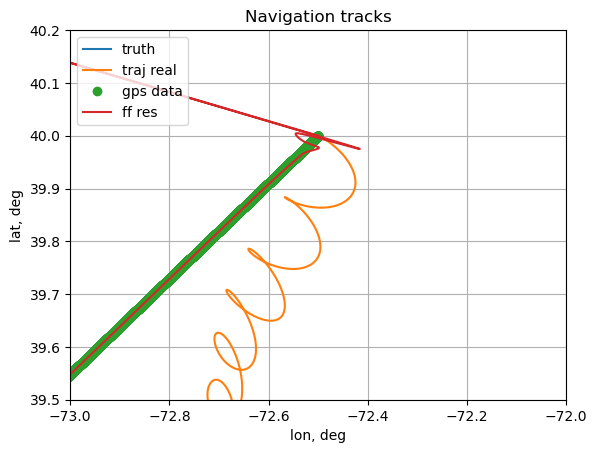

In [38]:
plt.plot(traj.lon, traj.lat, label='truth')
plt.plot(traj_imu.lon, traj_imu.lat, label='traj real')
plt.plot(gps_data.lon, gps_data.lat, 'o', label='gps data')
plt.plot(ff_res.trajectory.lon, ff_res.trajectory.lat, label='ff res')
plt.grid()
plt.legend(loc='upper left')
plt.xlabel("lon, deg")
plt.ylabel("lat, deg")
plt.ylim([39.5, 40.2])
plt.xlim([-73,-72])
plt.title('Navigation tracks')
plt.show()

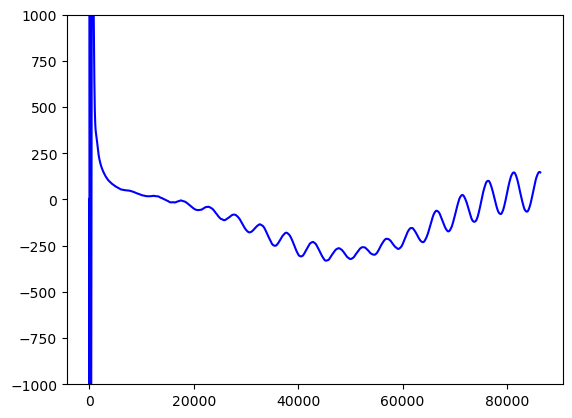

In [41]:
plt.plot(ff_filt_error.index, ff_filt_error.east, '-b')#, fb_filt_error.index, fb_filt_error.east, '-r')
plt.ylim([-1000, 1000])
#plt.xlim([0,50000])
plt.show()

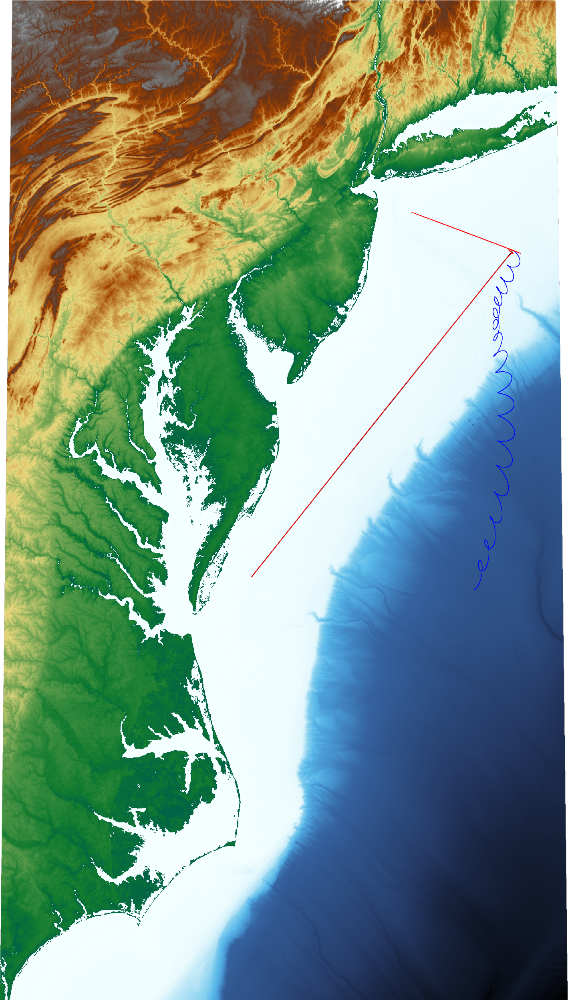

In [40]:
fig = pygmt.Figure()
fig.grdimage(data, projection='R12c', cmap='geo')
fig.plot(x=traj.lon, y=traj.lat, pen='black')
fig.plot(x=traj_imu.lon, y=traj_imu.lat, pen="blue")
fig.plot(x=ff_res.trajectory.lon, y=ff_res.trajectory.lat, pen="red")
fig.show()

In [1045]:
bathy = np.zeros_like(traj.index, dtype=float)
for i in traj.index:
    bathy[i] = data.interp(lon=traj.lon[i], lat=traj.lat[i]).data


In [1046]:
bathy

array([-65.        , -65.        , -65.        , ..., -26.10088027,
       -26.10669478, -26.11239636])

In [1062]:
bathy = pd.Series(bathy, name='depths')

In [1064]:
traj = pd.concat([traj, bathy], axis=1)

In [1065]:
traj

,lat,lon,alt,VN,VE,VD,roll,pitch,heading,depths
0,40.000000,-72.500000,0.0,-3.359772,-2.867883,2.920916e-09,0.0,0.0,235.0,-65.000000
1,39.999970,-72.500034,0.0,-3.359772,-2.867882,-1.194145e-09,0.0,0.0,235.0,-65.000000
2,39.999939,-72.500067,0.0,-3.359772,-2.867882,-2.114366e-10,0.0,0.0,235.0,-65.000000
3,39.999909,-72.500101,0.0,-3.359772,-2.867882,1.157256e-09,0.0,0.0,235.0,-65.000000
4,39.999879,-72.500134,0.0,-3.359772,-2.867882,-8.079717e-10,0.0,0.0,235.0,-65.000000
...,...,...,...,...,...,...,...,...,...,...
86395,37.385206,-75.348506,0.0,-3.359772,-2.867882,6.698548e-10,0.0,0.0,235.0,-26.088912
86396,37.385175,-75.348539,0.0,-3.359772,-2.867882,7.391621e-11,0.0,0.0,235.0,-26.094953
86397,37.385145,-75.348571,0.0,-3.359772,-2.867882,-1.217319e-09,0.0,0.0,235.0,-26.100880
86398,37.385115,-75.348603,0.0,-3.359772,-2.867882,-1.075741e-09,0.0,0.0,235.0,-26.106695


In [1066]:
key_list = traj_imu.keys()

In [1067]:
key_list

Index(['lat', 'lon', 'alt', 'VN', 'VE', 'VD', 'roll', 'pitch', 'heading'], dtype='object')

In [1072]:
new_keys = {}
for key in key_list:
    new_keys[f"{key}"] = f'{key}_imu'
traj_imu.rename(columns=new_keys)

,lat_imu,lon_imu,alt_imu,VN_imu,VE_imu,VD_imu,roll_imu,pitch_imu,heading_imu
stamp,,,,,,,,,
0,40.000090,-72.499883,0.0,0.000000,0.000000,0.0,0.000000,0.000000,235.000000
1,40.000090,-72.499883,0.0,-0.000270,0.000313,0.0,-0.000010,-0.000038,-124.999978
2,40.000090,-72.499883,0.0,-0.000546,0.000619,0.0,-0.000020,-0.000077,-124.999957
3,40.000090,-72.499883,0.0,-0.000827,0.000922,0.0,-0.000030,-0.000115,-124.999935
4,40.000090,-72.499883,0.0,-0.001113,0.001220,0.0,-0.000040,-0.000154,-124.999914
...,...,...,...,...,...,...,...,...,...
86395,37.383590,-75.363282,0.0,-3.668829,-6.953087,0.0,-0.005390,0.010670,-125.009046
86396,37.383557,-75.363361,0.0,-3.668180,-6.951086,0.0,-0.005409,0.010701,-125.009074
86397,37.383524,-75.363439,0.0,-3.667530,-6.949078,0.0,-0.005428,0.010733,-125.009102


In [1069]:
traj_imu2 = traj_imu.copy()

In [1077]:
traj.index.name='time'

In [1083]:
traj.to_csv('truth.csv')

In [1084]:
import h5py

In [1087]:
with h5py.File('IMU.h5', 'w') as hf:
    hf.create_dataset('gyros', data=gyro_e)
    hf.create_dataset('accels', data=accel_e)

In [1105]:
data_in = {}
with h5py.File('IMU.h5', "r") as f:
    data_in['accels'] = np.array(f['accels'])
    data_in['gyros'] = f['gyros']

In [1106]:
data_in

{'accels': array([[-4.09912452e-03, -7.81060584e-03, -9.81009552e+00],
        [-4.18231296e-03, -7.34803891e-03, -9.81027700e+00],
        [-4.75275645e-03, -6.80650939e-03, -9.81003598e+00],
        ...,
        [-4.46267955e-03, -7.39330358e-03, -9.80821064e+00],
        [-3.88674975e-03, -7.69373212e-03, -9.80780942e+00],
        [-3.92157981e-03, -7.45841475e-03, -9.80771226e+00]]),
 'gyros': <Closed HDF5 dataset>}

In [1104]:
data_in['accels']

<Closed HDF5 dataset>

In [1108]:
truth = traj.copy()

In [1109]:
with h5py.File('TRUTH.h5', 'w') as f:
    f.create_dataset('truth', data=truth)

In [1110]:
with h5py.File('TRUTH.h5', 'r') as f:
    data_in = pd.DataFrame(f['truth'])

In [1111]:
data_in

,0,1,2,3,4,5,6,7,8,9
0,40.000000,-72.500000,0.0,-3.359772,-2.867883,2.920916e-09,0.0,0.0,235.0,-65.000000
1,39.999970,-72.500034,0.0,-3.359772,-2.867882,-1.194145e-09,0.0,0.0,235.0,-65.000000
2,39.999939,-72.500067,0.0,-3.359772,-2.867882,-2.114366e-10,0.0,0.0,235.0,-65.000000
3,39.999909,-72.500101,0.0,-3.359772,-2.867882,1.157256e-09,0.0,0.0,235.0,-65.000000
4,39.999879,-72.500134,0.0,-3.359772,-2.867882,-8.079717e-10,0.0,0.0,235.0,-65.000000
...,...,...,...,...,...,...,...,...,...,...
86395,37.385206,-75.348506,0.0,-3.359772,-2.867882,6.698548e-10,0.0,0.0,235.0,-26.088912
86396,37.385175,-75.348539,0.0,-3.359772,-2.867882,7.391621e-11,0.0,0.0,235.0,-26.094953
86397,37.385145,-75.348571,0.0,-3.359772,-2.867882,-1.217319e-09,0.0,0.0,235.0,-26.100880
86398,37.385115,-75.348603,0.0,-3.359772,-2.867882,-1.075741e-09,0.0,0.0,235.0,-26.106695


In [43]:
accel.shape

(86399, 3)